## <b> Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present a more unique, personalized way of experiencing the world. Today, Airbnb became one of a kind service that is used and recognized by the whole world. Data analysis on millions of listings provided through Airbnb is a crucial factor for the company. These millions of listings generate a lot of data - data that can be analyzed and used for security, business decisions, understanding of customers' and providers' (hosts) behavior and performance on the platform, guiding marketing initiatives, implementation of innovative additional services and much more. </b>

## <b>This dataset has around 49,000 observations in it with 16 columns and it is a mix between categorical and numeric values. </b>

## <b> Explore and analyze the data to discover key understandings (not limited to these) such as : 
* What can we learn about different hosts and areas?
* What can we learn from predictions? (ex: locations, prices, reviews, etc)
* Which hosts are the busiest and why?
* Is there any noticeable difference of traffic among different areas and what could be the reason for it? </b>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.express as px
import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
%matplotlib inline

In [3]:
filename = '/content/drive/MyDrive/Almabetter/Airbnb NYC 2019/Airbnb NYC 2019.csv'
df = pd.read_csv(filename)

In [4]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


#EXAMINE THE DATASET

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

With df.info we get the Dtype of the column. To make future predictions it is very important to have an idea about Dtype.

In [6]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

From the information above, there are 48895 rows and some columns of them having null values. Like name, host_name, last_review and reviews_per_month.
From the above table we can say that there is relation between last_review and reviews_per_month. We can say that the data is coming from Missing data which is **not completely at random.**


In [7]:
df.isnull().mean()

id                                0.000000
name                              0.000327
host_id                           0.000000
host_name                         0.000429
neighbourhood_group               0.000000
neighbourhood                     0.000000
latitude                          0.000000
longitude                         0.000000
room_type                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
last_review                       0.205583
reviews_per_month                 0.205583
calculated_host_listings_count    0.000000
availability_365                  0.000000
dtype: float64

From the data we get the number of null values in percentage. Like last_review having 20.55% missing values and reviews_per_month having also 20.55% missing values.

In [8]:
cols=['last_review','reviews_per_month']
for col in cols:
    df[col] = df[col].fillna(0)

The above line shows that we have to remove those NA values from the review_per_month which does not have last review date in it. It shows that if the last date is NA that means there must not the review inserted in it which we substituing as zero.

In [9]:
df.isnull().sum()

id                                 0
name                              16
host_id                            0
host_name                         21
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64

#DROP THE COLUMNS WHICH ARE NOT NECESSARY


In [10]:
df = df.drop(['host_id','name','last_review','id'],axis=1)

In [11]:
df.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327
std,0.054530,0.046157,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289
min,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


There might be a question like how to deal with null value and we obviously know to put mean/mode/median in place of the null value. But for this we need the description of the data. To see whether which quartile of data having the most missing values.

From the table above we have atleast the basic idea of having null values in which segment of the data. To deal with it we are going to use EDA which helps to deal with missing values.

##To replace the null and zero values with median

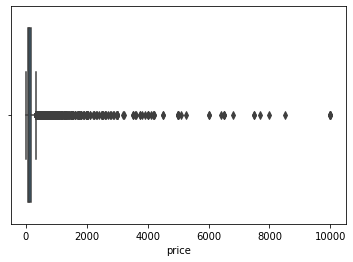

In [12]:
figsize=(12,8)
sns.boxplot(x=df.price)

In [13]:
df.loc[df['price']==0,'price'].count()

11

In [14]:
df.loc[df['price']==0,'price']= df['price'].median()

There must be missing values or erroneous data in price column because there must be some price.We are replacing the values in price with mean of the price column.

In [15]:
df.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.744534,7.029962,23.274466,1.090910,7.143982,112.781327
std,0.054530,0.046157,240.144266,20.510550,44.550582,1.597283,32.952519,131.622289
min,40.499790,-74.244420,10.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


The price of hotel cannot be zero atleast there should some amount or value.
This shows we have missing values in the data which we have to replace with median.

Above table shows us the appropriate values for further operations. We replaced the null values with median value respective to the tables.

**Great we completed the handling missing values**

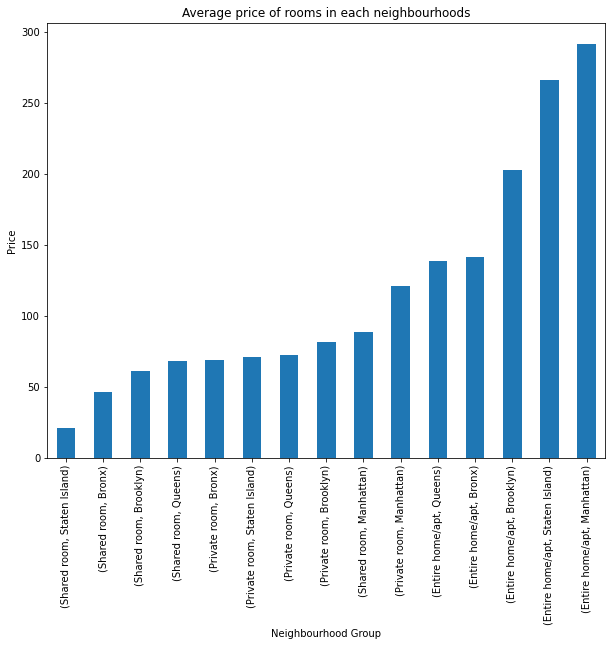

In [16]:
plt.figure(figsize=(10,8))
temp=df[df['minimum_nights']==1]
temp1=temp.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
temp1.plot(kind='bar')
plt.title('Average price of rooms in each neighbourhoods')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Price')
plt.show()

In [17]:
pd.DataFrame(temp1).sort_values(by='room_type')

price
room_type       neighbourhood_group            
Entire home/apt Queens               139.036260
                Bronx                141.541176
                Brooklyn             202.895245
                Staten Island        266.205128
                Manhattan            291.784595
Private room    Bronx                 69.025862
                Staten Island         71.394366
                Queens                72.454958
                Brooklyn              81.814591
                Manhattan            121.434183
Shared room     Staten Island         21.000000
                Bronx                 46.711111
                Brooklyn              60.921212
                Queens                68.459459
                Manhattan             88.462898

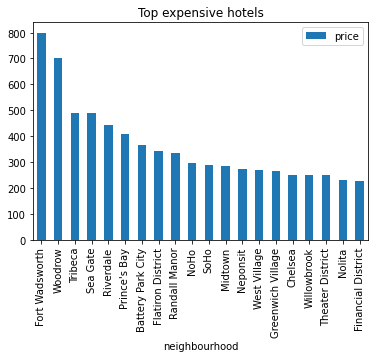

In [18]:
temp2=df.groupby('neighbourhood')[['neighbourhood','price']].agg('mean').sort_values(by='price',ascending=False).head(20)
temp2.plot(kind='bar')
plt.title('Top expensive hotels')
plt.show()

In [19]:
temp2.head(10)

,price
neighbourhood,
Fort Wadsworth,800.000000
Woodrow,700.000000
Tribeca,490.638418
Sea Gate,487.857143
Riverdale,442.090909
Prince's Bay,409.500000
Battery Park City,367.557143
Flatiron District,341.925000
Randall Manor,336.000000


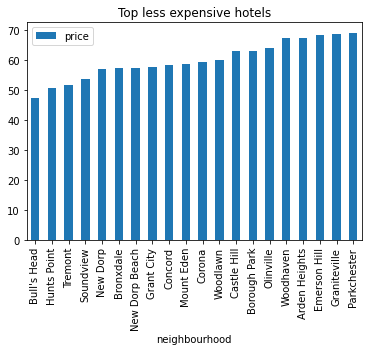

In [20]:
temp3=df.groupby('neighbourhood')[['neighbourhood','price']].agg('mean').sort_values(by='price',ascending=True).head(20)
temp3.plot(kind='bar')
plt.title('Top less expensive hotels')
plt.show()

In [21]:
temp3.head(10)

,price
neighbourhood,
Bull's Head,47.333333
Hunts Point,50.500000
Tremont,51.545455
Soundview,53.466667
New Dorp,57.000000
Bronxdale,57.105263
New Dorp Beach,57.400000
Grant City,57.666667
Concord,58.192308


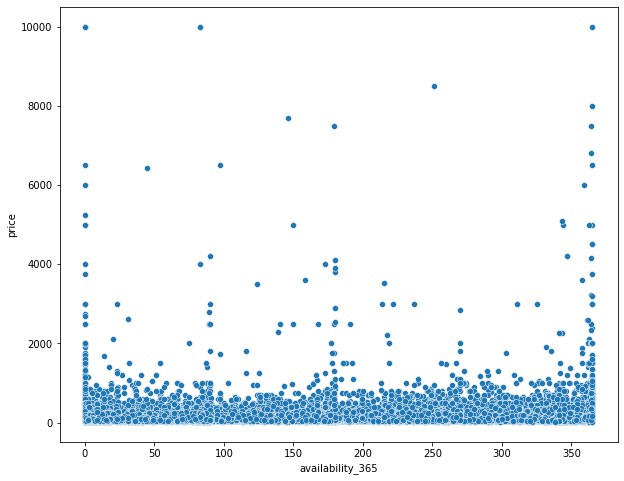

In [22]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df.availability_365,y=df.price)

#What can we learn about different hosts and areas?

We have to define the superhosts who are using Airbnb service. To calculate this the number of hosting used service of Airbnb we have to count the maximum of calculated_host_listings_count column and represent the host_name. Calculate the top three superhosts.

*We can encourage the superhosts by giving price distribution.*

In [23]:
#There are multiple rows in out dataset of same host name there must be same hosts giving services from different location
#We group by the host names and find the average count listing to get appropriate results.

In [24]:
df_super_hosts = df.groupby('host_name')['calculated_host_listings_count'].mean().reset_index().sort_values(by='calculated_host_listings_count',ascending=False).head(3)

In [25]:
df_super_hosts

,host_name,calculated_host_listings_count
9781,Sonder (NYC),327.0
1356,Blueground,232.0
5471,Kazuya,103.0


###As we can see from above table The top three hosts are Sonder(NYC), Blueground and Kazuya with there respective average host listing count.


***Sonder (NYC), Blueground and Kazuya got reward to be in top three's on host listing count.***

We can use the rewards as the key to best hosts service available in airbnb.


Considering the maximum ratings from reviews per month. Those who got maximum rating reffered to as good service available there. Find the hosts name and give them reward for giving good service to the customers.

In [26]:
df_monthly_hosts_reviews = df.groupby('host_name')['reviews_per_month'].mean().reset_index().sort_values(by='reviews_per_month',ascending=False).head(3)
df_monthly_hosts_reviews

,host_name,reviews_per_month
7564,Nalicia,18.126667
2652,Dona,13.990000
208,Aisling,13.420000


###From the table above Nalicia,Dona and Aisling got the maximum reviews as per average review month.

In [27]:
df_hosts_reviews_number = df.groupby('host_name')['number_of_reviews'].mean().reset_index().sort_values(by='number_of_reviews',ascending=False).head(3)
df_hosts_reviews_number

,host_name,number_of_reviews
2652,Dona,602.5
936,Asa,488.0
2495,Dennis & Naoko,441.0


###The maximum number of reviews recieved by Dona, Asa and Dennis & Naoko.

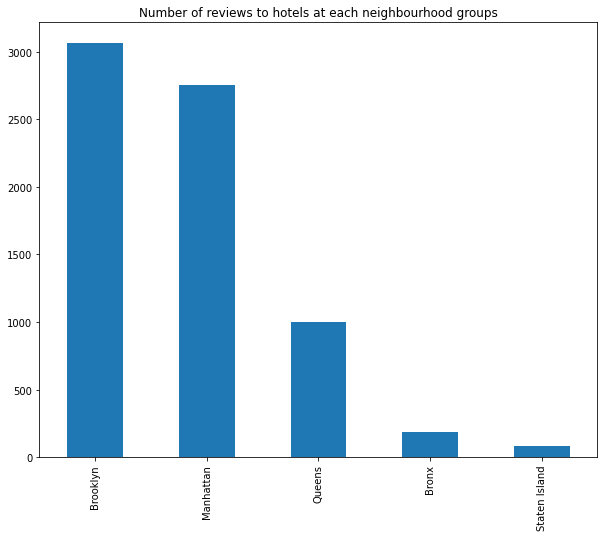

In [28]:
plt.figure(figsize=(10,8))
temp5=df[df['number_of_reviews']>=50]
temp6=temp5['neighbourhood_group'].value_counts()
temp6.plot(kind='bar')
plt.title('Number of reviews to hotels at each neighbourhood groups')
plt.show()


In [29]:
pd.DataFrame(temp6)

,neighbourhood_group
Brooklyn,3065
Manhattan,2751
Queens,997
Bronx,187
Staten Island,81


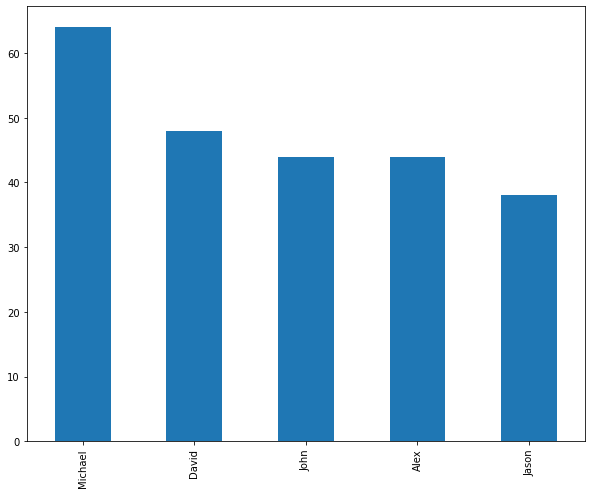

In [30]:
plt.figure(figsize=(10,8))
temp7=temp5['host_name'].value_counts().head(5)
temp7.plot(kind='bar')
plt.show()

##What if we talk about area?

In [31]:
df['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

There are three types of rooms available in Airbnb. We can now visually see how much of this rooms are their in Airbnb.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Room types')

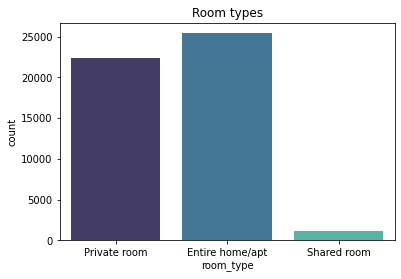

In [32]:
sns.countplot(df['room_type'],palette='mako')
# fig = plt.gcf()
# fig.set_size_inches(10,10)
plt.title('Room types')

From above we can conclude that Entire home/apt having maximum in number.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Neighbourhood Group')

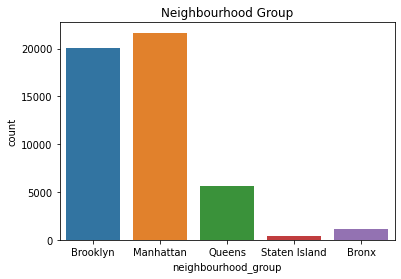

In [33]:
sns.countplot(df['neighbourhood_group'])
plt.title('Neighbourhood Group')

From the above bar plot we can conclude that the Manhattan having maximum number of counts of Airbnb Houses followed by brooklyn.

In [34]:
temp=df.groupby('neighbourhood_group')['neighbourhood'].count().reset_index().sort_values(by='neighbourhood',ascending=False)
temp.head(5)

,neighbourhood_group,neighbourhood
2,Manhattan,21661
1,Brooklyn,20104
3,Queens,5666
0,Bronx,1091
4,Staten Island,373


###What if we talk about prices in different areas

##What can we learn from predictions? 

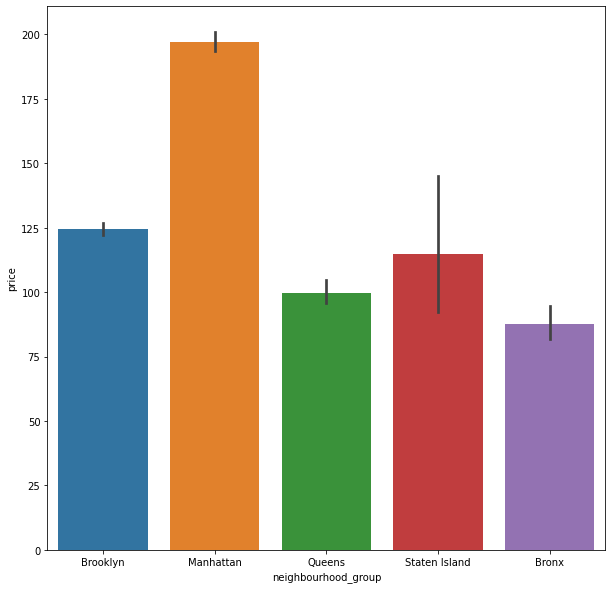

In [35]:
#bar graph will be best for showing the pricing from the respective areas.
sns.barplot(x=df['neighbourhood_group'],y=df['price'])
fig = plt.gcf()
fig.set_size_inches(10,10)

###We can see the most expensive place is Manhattan followed by Brooklyn.

###**MAPPING**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



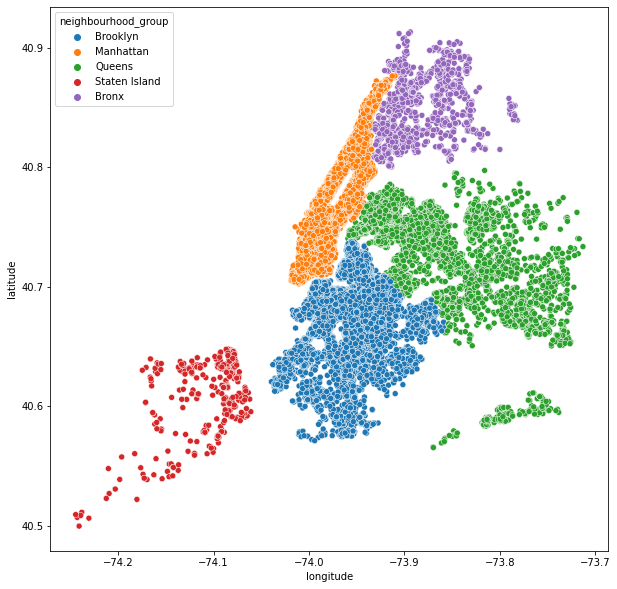

In [36]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.ioff()

We can get a idea about Airbnb Services in different area of regions.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



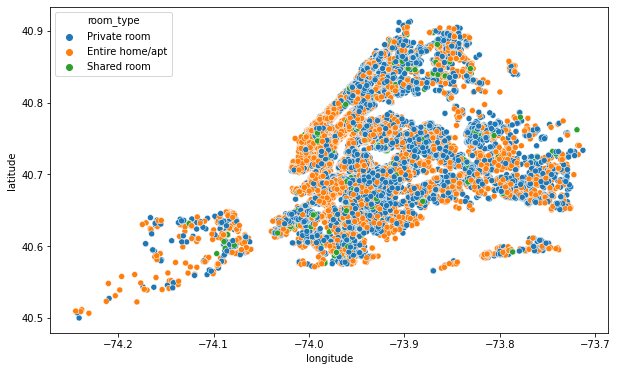

In [37]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.room_type)
plt.ioff()

From map type also we can find the room type in different areas.
To find the availabilty of the room is the difficult question?
What to do next?
We have to Show the availabilty in the map so that customer easily get there destination.

##What if we talk about reviews in different areas

In [38]:
df_reviews_diff_areas = df.groupby('neighbourhood_group')['reviews_per_month'].mean().reset_index().sort_values(by='reviews_per_month',ascending=False).head(3)
df_reviews_diff_areas

,neighbourhood_group,reviews_per_month
4,Staten Island,1.576381
3,Queens,1.567076
0,Bronx,1.475655


In [39]:
df_number_reviews_diff_areas = df.groupby('neighbourhood_group')['number_of_reviews'].mean().reset_index().sort_values(by='number_of_reviews',ascending=False).head(3)
df_number_reviews_diff_areas

,neighbourhood_group,number_of_reviews
4,Staten Island,30.941019
3,Queens,27.700318
0,Bronx,26.004583


From both the tables above, their having maximum number of review and average rating per month having same neighbourhood groups. This means Staten Island, Queens and Bronx giving maximum customer satisfaction.

##Which hosts are the busiest and why?

###Busy hosts are those who have no availability or availability 365 is equal to zero.

In [40]:
df_busiest_hosts = df.groupby('host_name')['price','availability_365'].min().reset_index().sort_values(by='price',ascending=True).head(3)
df_busiest_hosts

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,host_name,price,availability_365
6827,Martin,10,0
6401,Luz,10,0
6764,Mario,10,0


In [41]:
df_busiest_hosts1 = df.groupby('host_name')['number_of_reviews','reviews_per_month','minimum_nights'].max().reset_index().sort_values(by='number_of_reviews',ascending=False).head(3)
df_busiest_hosts1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,host_name,number_of_reviews,reviews_per_month,minimum_nights
2652,Dona,629,14.58,1
4931,Jj,607,7.75,14
6981,Maya,543,11.59,30


###There are two reasons for the business of host.


---

1.   Their might some errors in the availability 365. It can happen while collecting the data. In this scenario it is very difficult to predictions. We cannot say these names are the busiest one or not. It is totally based on data collection. 
2.  If we are assuming our data is correct then we can say there are several factors which affect the business of the host.


*   Maximum customer satisfaction/maximum positive reviews
*   As we have seen in the visualisation the number of demand of Entire Home or aparment is greater than all. These host might offering this service.


*   They may charge less than the compatitors.









##Is there any noticeable difference of traffic among different areas and what could be the reason for it?

If we talk about traffic in diiferent area there might be reasons like most attractive place, number of houses in the area is greater, service by hosts is good, availability, minimum prices or discounts, etc.


Let's move forward and explore the visualisations with high traffic areas to predict which area having maximum traffic.



***Let's make the visualisation interactive to get appropriate idea of specific.***

In [42]:
locations=list(zip(df.latitude,df.longitude))
m=folium.Map(location=[40.80,-73.7],zoom_start=9)
FastMarkerCluster(data=locations).add_to(m)
m

In [43]:
Map_scatter = px.scatter_mapbox(df, lat='latitude', lon='longitude', hover_name='neighbourhood_group', hover_data=['availability_365','price','room_type'],
                        title="Total number of Airbnb Service in NEW YORK CITY",color='availability_365')
Map_scatter.update_layout(mapbox_style="open-street-map")
Map_scatter.show()

From the above visualisation, the dark blue circle dot shows the low availabilty and dark yellow circle shows the high availability. By this the customer should have the idea about availability of houses in different areas.
This is an interactive map which gives us availability at Locations. It helps us to determine the traffic in specific area.

**Offcourse there will more traffic where the map shows dark blue dot means low availability as per the visualisation**

**From above visualisation we have idea of the area where the number of Airbnb is very high. It happens because demand in that perticular area must be very high.** 

In [44]:
#As we have already longitude and latitude in our data we don't need to read an external data for map NYC.

Map_scatter = px.scatter_mapbox(df, lat='latitude', lon='longitude', hover_name='neighbourhood_group', hover_data=['neighbourhood_group','price','room_type','availability_365'],
                        title="Total number of Airbnb Service in NEW YORK CITY",color='room_type')
Map_scatter.update_layout(mapbox_style="open-street-map")
Map_scatter.show()

**From above visualisation we can easily identify in which region which room types are available**

I we move mouse cursor on specific point we not only get the information about availability but also get prices for specific room type.